# Challenge for “Merit Prize 2025-26”
Author:\
Hugo Sebastião\
Nr. 79768\
Aprendizagem - Taguspark\
tpc group - 4\
merit prize group - 1\
Instituto Superior Técnico - Taguspark

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV  #, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc  #, classification_report, confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
#from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.inspection import permutation_importance
#from scipy.spatial.distance import cdist
from sklearn.preprocessing import normalize
import lime
from lime.lime_text import LimeTextExplainer
import time
import io
import os
import warnings
warnings.filterwarnings('ignore')

try:
    from google.colab import files
    local = False
    print('You are in Google Colab')
except ModuleNotFoundError:
    local = True
    print('Not in Google Colab')

# Set random seed for reproducibility
SEED = 42

Not in Google Colab


## 1 - Model Training & Evaluation

### Choose Path and Load Data

In [2]:
# Path to the CSV file
if local:
    train_path = 'train.csv'
    val_path = 'val.csv'
    test_path = 'test.csv'

# The following only runs in google colab
# Select all 3 datasets, train.csv | val.csv | test.csv
else:
    try:
        os.remove('test.csv')
        os.remove('train.csv')
        os.remove('val.csv')
        print("Previous files removed.")
    except FileNotFoundError:
        print("Files not found (safe to proceed).")
    
    uploaded = files.upload() 
    train_path = io.StringIO(uploaded['train.csv'].decode('utf-8'))
    val_path = io.StringIO(uploaded['val.csv'].decode('utf-8'))
    test_path = io.StringIO(uploaded['test.csv'].decode('utf-8'))

In [3]:
# Load the data
pd.set_option('display.max_colwidth', 50)

train = pd.read_csv(train_path)
val = pd.read_csv(val_path)
test = pd.read_csv(test_path)

print("train data: ", train.shape)
print(train.head())
print()
print("val data: ", val.shape)
print(val.head())
print()
print("test data: ", test.shape)
print(test.head())


train data:  (50587, 2)
                                                Text  Label
0  PJ em operação internacional de tráfico de dro...      1
1  O texto foi criado - numa universidade da Repú...      1
2  Nunca pague multas por conduzir sem carta ou s...      0
3  Depois de António Guterres, uma estátua de D. ...      0
4  O MAR, uma droga gratuita que cura pelo menos ...      0

val data:  (6324, 2)
                                                Text  Label
0  PSD quer colocar sistema de saúde português en...      1
1  Covid-19. CM Lisboa homenageia profissionais q...      1
2  ADRIANO MOREIRA - Documento prova que reabriu ...      0
3  A garantia foi dada pelo almirante Henrique Go...      0
4  Carrinha abalroa barreiras de segurança nas im...      1

test data:  (6324, 2)
                                                Text  Label
0  Antiga presidente da Raríssimas exige 147 mil ...      0
1  Claro que o estado e o governo são também resp...      0
2  Reforço do abono de família:

## 1a) Extract TF-IDF features

In [4]:
x_train_text = train["Text"]
y_train      = train["Label"]

x_val_text = val["Text"]
y_val      = val["Label"]

x_test_text = test["Text"]
y_test      = test["Label"]

# TF-IDF vectorizer with specified parameters
tfidf = TfidfVectorizer(max_features=5000, min_df=10, max_df=0.9, smooth_idf=True)

# Fit on training data
x_train = tfidf.fit_transform(x_train_text)
x_val   = tfidf.transform(x_val_text)
x_test  = tfidf.transform(x_test_text)

print('Train shape:', x_train.shape)
print('Val shape:', x_val.shape)
print('Test shape:', x_test.shape)


Train shape: (50587, 5000)
Val shape: (6324, 5000)
Test shape: (6324, 5000)


## 1b) Model training & hyperparameter tuning

In [5]:
# Helper function to compute metrics
def evaluate_model(model, x_test, y_test, model_name='model'):
    y_pred = model.predict(x_test)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    return {
        'Model': model_name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-score': f1,
        'Hyperparameters': model.get_params()
    }

# Helper function to show metrics
def show_all_metrics(best_model, model_name, isNB):
    if isNB:
        x_train_aux = x_train_dense
        x_val_aux = x_val_dense
        x_test_aux = x_test_dense
    else:
        x_train_aux = x_train
        x_val_aux = x_val
        x_test_aux = x_test
    
    metrics_test = evaluate_model(best_model, x_test_aux, y_test, model_name + " (test)")
    metrics_val = evaluate_model(best_model, x_val_aux, y_val, model_name + " (val)")
    metrics_train = evaluate_model(best_model, x_train_aux, y_train, model_name + " (train)")
    metrics_df = pd.DataFrame([metrics_test, metrics_val, metrics_train])
    return metrics_df

# Helper function to show best estimators
def show_best_estimators (gs):
    pd.set_option('display.max_colwidth', None)
    results_df = pd.DataFrame(gs.cv_results_)
    results_df = results_df.sort_values(by='rank_test_score')
    relevant_cols = ['params', 'mean_test_score']
    print(results_df[relevant_cols].head(10))

### Decision Tree

In [6]:
params_dt = {
    'max_depth': [45],
    'min_samples_leaf': [1],
    'min_samples_split': [2],
}

dt = DecisionTreeClassifier(random_state=SEED)
gs_dt = GridSearchCV(dt, params_dt, cv=5, scoring='f1', n_jobs=-2)

start_time = time.time()

gs_dt.fit(x_train, y_train)

end_time = time.time()
minutes = (end_time - start_time) / 60

print(f"Done! Search took {minutes:.1f} minutes.")
best_dt = gs_dt.best_estimator_
best_dt_params = gs_dt.best_params_
print('Best Decision Tree params:', best_dt_params)
print('Best Validation Score (F1):', gs_dt.best_score_)

dt_metrics = show_all_metrics(best_dt, "Decision Tree", False)
dt_metrics

Done! Search took 1.9 minutes.
Best Decision Tree params: {'max_depth': 45, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Validation Score (F1): 0.83449306911159


,Model,Accuracy,Precision,Recall,F1-score,Hyperparameters
0,Decision Tree (test),0.842188,0.838831,0.846276,0.842537,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit..."
1,Decision Tree (val),0.843295,0.850160,0.836004,0.843022,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit..."
2,Decision Tree (train),0.972345,0.966972,0.978288,0.972597,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit..."


### Gaussian Naive Bayes

In [7]:
# Convert sparse matrix to dense for Naive Bayes
x_train_dense = x_train.toarray()
x_val_dense = x_val.toarray()
x_test_dense = x_test.toarray()

params_nb = {
    'var_smoothing': [1e-05],
    'priors': [[0.2, 0.8]]
}

nb = GaussianNB()
gs_nb = GridSearchCV(nb, params_nb, cv=5, scoring='f1', n_jobs=1)

start_time = time.time()

gs_nb.fit(x_train_dense, y_train)

end_time = time.time()
minutes = (end_time - start_time) / 60

best_nb = gs_nb.best_estimator_
best_nb_params = gs_nb.best_params_

print(f"Done! Search took {minutes:.1f} minutes.")
print('Best Gaussian Naive Bayes params:', best_nb_params)
print('Best Validation Score (F1):', gs_nb.best_score_)

nb_metrics = show_all_metrics(best_nb, "Gaussian Naive Bayes", True)
nb_metrics

Done! Search took 0.5 minutes.
Best Gaussian Naive Bayes params: {'priors': [0.2, 0.8], 'var_smoothing': 1e-05}
Best Validation Score (F1): 0.8511823088115366


,Model,Accuracy,Precision,Recall,F1-score,Hyperparameters
0,Gaussian Naive Bayes (test),0.853890,0.846536,0.863708,0.855036,"{'priors': [0.2, 0.8], 'var_smoothing': 1e-05}"
1,Gaussian Naive Bayes (val),0.852467,0.845092,0.865536,0.855192,"{'priors': [0.2, 0.8], 'var_smoothing': 1e-05}"
2,Gaussian Naive Bayes (train),0.859391,0.852756,0.869927,0.861256,"{'priors': [0.2, 0.8], 'var_smoothing': 1e-05}"


### Logistic Regression with L2

In [8]:
# Logistic Regression with L2
params_lr_l2 = {
    'C': [10],
    'solver': ['lbfgs'],
    'class_weight': [None]
}

lr_l2 = LogisticRegression(penalty='l2', random_state=SEED)
gs_lr_l2 = GridSearchCV(lr_l2, params_lr_l2, cv=5, scoring='f1', n_jobs=-2)

start_time = time.time()

gs_lr_l2.fit(x_train, y_train)

end_time = time.time()
minutes = (end_time - start_time) / 60

best_lr_l2 = gs_lr_l2.best_estimator_
best_lr_l2_params = gs_lr_l2.best_params_

print(f"Done! Search took {minutes:.1f} minutes.")
print('Best Logistic Regression (L2) params:', best_lr_l2_params)
print('Best Validation Score (F1):', gs_lr_l2.best_score_)

lr_l2_metrics = show_all_metrics(best_lr_l2, "Logistic Regression with L2", False)
lr_l2_metrics

Done! Search took 0.1 minutes.
Best Logistic Regression (L2) params: {'C': 10, 'class_weight': None, 'solver': 'lbfgs'}
Best Validation Score (F1): 0.9032870586775102


,Model,Accuracy,Precision,Recall,F1-score,Hyperparameters
0,Logistic Regression with L2 (test),0.903542,0.903840,0.902694,0.903267,"{'C': 10, 'class_weight': None, 'dual': False,..."
1,Logistic Regression with L2 (val),0.905914,0.906662,0.906378,0.906520,"{'C': 10, 'class_weight': None, 'dual': False,..."
2,Logistic Regression with L2 (train),0.936505,0.939209,0.933880,0.936537,"{'C': 10, 'class_weight': None, 'dual': False,..."


### Logistic Regression with L1

In [9]:
# Logistic Regression with L1
params_lr_l1 = {
    'C': [1],
    'solver': ['liblinear'],
    'class_weight': [None]
}

lr_l1 = LogisticRegression(penalty='l1', solver='liblinear', random_state=SEED)
gs_lr_l1 = GridSearchCV(lr_l1, params_lr_l1, cv=5, scoring='f1', n_jobs=-2)

start_time = time.time()

gs_lr_l1.fit(x_train, y_train)

end_time = time.time()
minutes = (end_time - start_time) / 60

best_lr_l1 = gs_lr_l1.best_estimator_
best_lr_l1_params = gs_lr_l1.best_params_

print(f"Done! Search took {minutes:.1f} minutes.")
print('Best Logistic Regression (L1) params:', best_lr_l1_params)
print('Best Validation Score (F1):', gs_lr_l1.best_score_)

lr_l1_metrics = show_all_metrics(best_lr_l1, "Logistic Regression with L1", False)
lr_l1_metrics

Done! Search took 0.1 minutes.
Best Logistic Regression (L1) params: {'C': 1, 'class_weight': None, 'solver': 'liblinear'}
Best Validation Score (F1): 0.8985801884177773


,Model,Accuracy,Precision,Recall,F1-score,Hyperparameters
0,Logistic Regression with L1 (test),0.900854,0.901525,0.899525,0.900524,"{'C': 1, 'class_weight': None, 'dual': False, ..."
1,Logistic Regression with L1 (val),0.904491,0.905886,0.904178,0.905031,"{'C': 1, 'class_weight': None, 'dual': False, ..."
2,Logistic Regression with L1 (train),0.921067,0.924525,0.917566,0.921032,"{'C': 1, 'class_weight': None, 'dual': False, ..."


### Multi-Layer Perceptron (MLP)

In [10]:
params_mlp = {
    'hidden_layer_sizes': [(120,)],
    'solver': ['adam'],
    'alpha': [0.0001],
    'learning_rate_init': [0.01]
}
mlp = MLPClassifier(
    random_state=SEED,
    max_iter=50,
    early_stopping=True
)
gs_mlp = GridSearchCV(mlp, params_mlp, cv=5, scoring='f1', n_jobs=-3)

start_time = time.time()

gs_mlp.fit(x_train, y_train)

end_time = time.time()
minutes = (end_time - start_time) / 60

best_mlp = gs_mlp.best_estimator_
best_mlp_params = gs_mlp.best_params_

print(f"Done! Search took {minutes:.1f} minutes.")
print('Best Multi-Layer Perceptron params:', best_mlp_params)
print('Best Validation Score (F1):', gs_mlp.best_score_)

mlp_metrics = show_all_metrics(best_mlp, "Multi-Layer Perceptron (MLP)", False)
mlp_metrics

Done! Search took 6.7 minutes.
Best Multi-Layer Perceptron params: {'alpha': 0.0001, 'hidden_layer_sizes': (120,), 'learning_rate_init': 0.01, 'solver': 'adam'}
Best Validation Score (F1): 0.9166040745429009


,Model,Accuracy,Precision,Recall,F1-score,Hyperparameters
0,Multi-Layer Perceptron (MLP) (test),0.918564,0.903670,0.936609,0.919844,"{'activation': 'relu', 'alpha': 0.0001, 'batch..."
1,Multi-Layer Perceptron (MLP) (val),0.919197,0.906821,0.935595,0.920983,"{'activation': 'relu', 'alpha': 0.0001, 'batch..."
2,Multi-Layer Perceptron (MLP) (train),0.990057,0.987420,0.992828,0.990117,"{'activation': 'relu', 'alpha': 0.0001, 'batch..."


## 1c) Comparison table with test metrics

In [11]:
metrics_df = pd.DataFrame([dt_metrics.iloc[0], nb_metrics.iloc[0], lr_l2_metrics.iloc[0], lr_l1_metrics.iloc[0], mlp_metrics.iloc[0]])
metrics_df

,Model,Accuracy,Precision,Recall,F1-score,Hyperparameters
0,Decision Tree (test),0.842188,0.838831,0.846276,0.842537,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit..."
0,Gaussian Naive Bayes (test),0.853890,0.846536,0.863708,0.855036,"{'priors': [0.2, 0.8], 'var_smoothing': 1e-05}"
0,Logistic Regression with L2 (test),0.903542,0.903840,0.902694,0.903267,"{'C': 10, 'class_weight': None, 'dual': False,..."
0,Logistic Regression with L1 (test),0.900854,0.901525,0.899525,0.900524,"{'C': 1, 'class_weight': None, 'dual': False, ..."
0,Multi-Layer Perceptron (MLP) (test),0.918564,0.903670,0.936609,0.919844,"{'activation': 'relu', 'alpha': 0.0001, 'batch..."


### ROC curve and AUC for the best classifier

Best model based on F1-score: Multi-Layer Perceptron (MLP) (test)


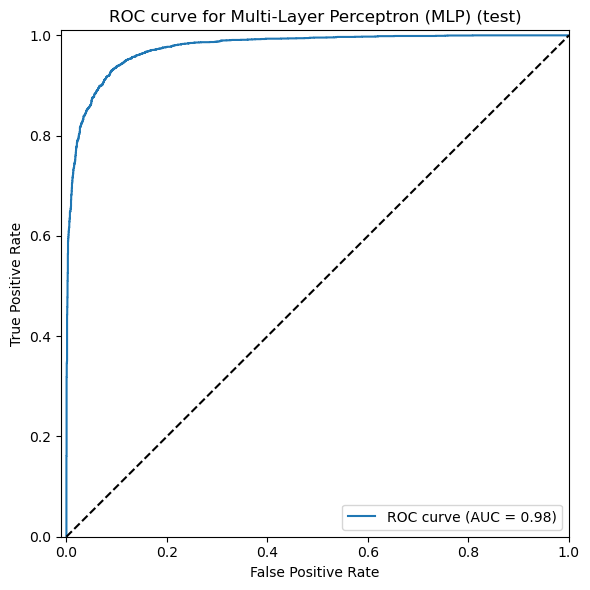

In [12]:
# Determine best model by highest F1-score
best_model_name = metrics_df.sort_values('F1-score', ascending=False).iloc[0]['Model']
print('Best model based on F1-score:', best_model_name)

# Compute ROC curve and AUC
if best_model_name == 'Decision Tree':
    best_clf = best_dt
elif best_model_name == 'Gaussian NB':
    best_clf = best_nb
    y_scores = best_clf.predict_proba(x_test_dense)[:, 1]
elif best_model_name == 'LogReg L2':
    best_clf = best_lr_l2
elif best_model_name == 'LogReg L1':
    best_clf = best_lr_l1
else:
    best_clf = best_mlp

if best_model_name != 'Gaussian NB':
    y_scores = best_clf.predict_proba(x_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0,1],[0,1],'k--')
plt.xlim([-0.01,1.0])
plt.ylim([0.0,1.01])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title(f'ROC curve for {best_model_name}')
plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig('best_model_roc.png')
plt.show()


## 2 - Model Interpretation

### 2a) Extract and visualize the weights in a bar plot

In [13]:
# Choose the better of L1 and L2 logistic regression based on F1
best_lr = best_lr_l2 if lr_l2_metrics.iloc[0]['F1-score'] >= lr_l1_metrics.iloc[0]['F1-score'] else best_lr_l1
best_lr_name = 'LogReg L2' if best_lr is best_lr_l2 else 'LogReg L1'
print('The Best Logistic Regression model is: ', best_lr_name)

# Get feature names and weights
feature_names = np.array(tfidf.get_feature_names_out())
coefs = best_lr.coef_[0]

The Best Logistic Regression model is:  LogReg L2


#### Top 10 words most indicative of fake news

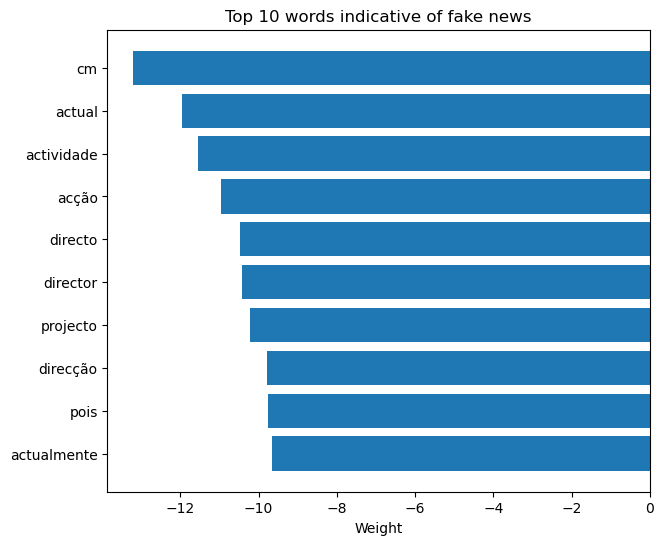

In [14]:
# Get words with most negative weights
neg_idx = np.argsort(coefs)[:10]
neg_words = feature_names[neg_idx]
neg_weights = coefs[neg_idx]

# Plot top 10 words indicative of fake news
plt.figure(figsize=(7, 6))
plt.barh(neg_words, neg_weights)
plt.title("Top 10 words indicative of fake news")
plt.xlabel("Weight")
plt.gca().invert_yaxis()
plt.show()

In [33]:
neg_words

array(['cm', 'actual', 'actividade', 'acção', 'directo', 'director',
       'projecto', 'direcção', 'pois', 'actualmente'], dtype=object)

In [32]:

neg_weights

array([-13.19892591, -11.96178328, -11.55169884, -10.96981316,
       -10.4654247 , -10.4215698 , -10.20785408,  -9.7778857 ,
        -9.74734319,  -9.6628564 ])

#### Top 10 words most indicative of real news

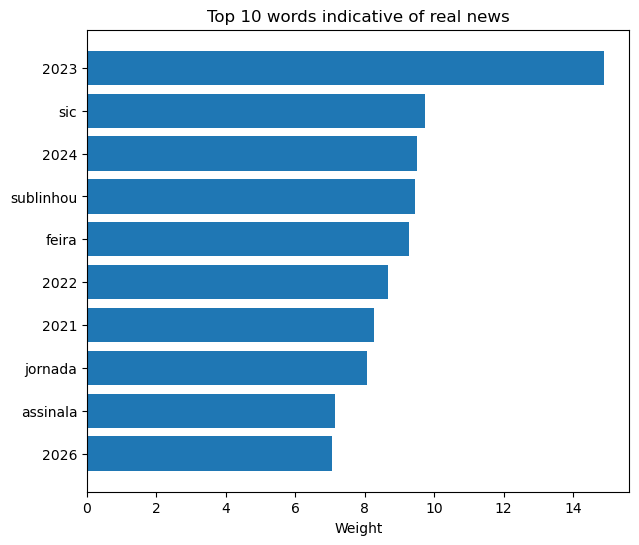

In [15]:
# Get words with highest positive weights
pos_idx = np.argsort(coefs)[-10:][::-1]
pos_words = feature_names[pos_idx]
pos_weights = coefs[pos_idx]

# Plot top 10 words indicative of real news
plt.figure(figsize=(7, 6))
plt.barh(pos_words, pos_weights)
plt.title("Top 10 words indicative of real news")
plt.xlabel("Weight")
plt.gca().invert_yaxis()
plt.show()

### 2b) L1 vs L2 comparison

In [16]:
# Count non-zero weights for L1 and L2
coefs_l2 = best_lr_l2.coef_[0]
coefs_l1 = best_lr_l1.coef_[0]

nonzero_l2 = np.sum(coefs_l2 != 0)
nonzero_l1 = np.sum(coefs_l1 != 0)

print(f'Non-zero features (L2): {nonzero_l2} / {len(coefs_l2)}')
print(f'Non-zero features (L1): {nonzero_l1} / {len(coefs_l1)}')

Non-zero features (L2): 5000 / 5000
Non-zero features (L1): 2014 / 5000


### 2c) Logistic Regression explanations with LIME

In [27]:
def lr_predict_proba(texts):
    x = tfidf.transform(texts)
    return best_lr.predict_proba(x)

class_names = ['fake', 'real']
explainer = LimeTextExplainer(class_names=class_names)

def explainer_instance(sid, classifier):
    text = val.loc[sid, 'Text']
    true_label = val.loc[sid, 'Label']

    exp = explainer.explain_instance(
        text_instance=text,
        classifier_fn=classifier,
        labels=[int(true_label)],
        num_features=10
    )

    exp.show_in_notebook(text=False)

In [28]:
# LIME explanation for sample 2921
explainer_instance(2921, lr_predict_proba)

# LIME explanation for sample 2437
explainer_instance(2437, lr_predict_proba)

# LIME explanation for sample 5557
explainer_instance(5557, lr_predict_proba)

# LIME explanation for sample 1697
explainer_instance(1697, lr_predict_proba)

### 2d) MLP explanations with LIME

In [19]:
np.random.seed(SEED)
indices = np.random.choice(x_test.shape[0], 1000, replace=False)
x_subset = x_test[indices].toarray()
y_subset = y_test.iloc[indices]

perm_importance = permutation_importance(best_mlp, x_subset, y_subset, n_repeats=10, random_state=SEED, n_jobs=-3)
importances = perm_importance.importances_mean

# Get top 10 important features
top_perm_idx = np.argsort(importances)[-10:][::-1]
perm_words = feature_names[top_perm_idx]
perm_vals = importances[top_perm_idx]

perm_df = pd.DataFrame({
    'Word': perm_words,
    'Importance': perm_vals
})
perm_df

,Word,Importance
0,moria,0.0031
1,inflação,0.0028
2,nacional,0.0023
3,vê,0.0022
4,idosos,0.0022
5,distrito,0.0020
6,arrendamento,0.0019
7,portugueses,0.0019
8,liberdade,0.0019
9,municipal,0.0018


In [20]:
def mlp_predict_proba(texts):
    x = tfidf.transform(texts)
    return best_mlp.predict_proba(x)

In [29]:
# MLP LIME explanation for sample 2921
explainer_instance(2921, mlp_predict_proba)

# MLP LIME explanation for sample 2437
explainer_instance(2437, mlp_predict_proba)

# MLP LIME explanation for sample 5557
explainer_instance(5557, mlp_predict_proba)

# MLP LIME explanation for sample 1697
explainer_instance(1697, mlp_predict_proba)

## 3 - Clustering

### 3a) - Clustering with K-Means (k=5)

In [22]:
k = 5
kmeans = KMeans(n_clusters=k, random_state=SEED)
kmeans.fit(x_train)

KMeans(n_clusters=5, random_state=42)

### 3b) - Assign semantic labels to each label

In [23]:
cluster_labels = kmeans.labels_
centroids = normalize(kmeans.cluster_centers_)

# Find nearest documents to each centroid
closest_docs = {}
for cluster_id in range(k):
    idxs = np.where(cluster_labels == cluster_id)[0]
    vectors = x_train[idxs]
    similarities = vectors @ centroids[cluster_id]        # cosine similarity
    top_idx = np.argsort(-similarities.ravel())[:3]
    closest_docs[cluster_id] = idxs[top_idx].tolist()

closest_docs

{0: [15740, 22326, 7751],
 1: [44850, 17593, 3944],
 2: [21092, 11216, 42301],
 3: [31161, 154, 39883],
 4: [6933, 40780, 9250]}

In [24]:
# Display the closest documents for each cluster
for cid, doc_indices in closest_docs.items():
    print(f"Cluster {cid}:")
    for i, doc_idx in enumerate(doc_indices, 1):
        print(f"Doc {i}: {x_train_text.iloc[doc_idx][:200]}...")

Cluster 0:
Doc 1: Compreender o conflito: o que podemos esperar da contraofensiva ucraniana?
Como será a contraofensiva ucraniana? E com que dimensão? É mau sinal estar a demorar tanto ou até pode fazer parte da estrat...
Doc 2: Líder do Grupo Wagner quer batalha final para clarificar situação na Ucrânia: “Em teoria, a Rússia já pôs um fim a isto”
Yevgeny Prigojin quer que a Rússia declare cumpridos os objetivos da "operação ...
Doc 3: A Rússia adormeceu e acordou em alvoroço com a "rebelião" do grupo paramilitar Wagner, que já controla Rostov e terá Moscovo como alvo. Prigozhin promete "ir até ao fim" e garante que os seus homens "...
Cluster 1:
Doc 1: “Estado não vai ter dinheiro para pagar reformas daqui a 15 anos” Para o economista vai haver um grave problema social quando os jovens tiverem de sustentar um exército de população envelhecida
Para J...
Doc 2: Orlando Costa. "Quero provar o meu valor  no campeonato português"
Selecionador nacional de Barbados, país minúsculo, a ilha ma

In [25]:
print('Semantic labels for each cluster')
print('Cluster 0: War in Ukraine misinformation')
print('Cluster 1: General societal and institutional misinformation')
print('Cluster 2: COVID-19 health misinformation')
print('Cluster 3: Political fake news')
print('Cluster 4: Economic policy misinformation')

Semantic labels for each cluster
Cluster 0: War in Ukraine misinformation
Cluster 1: General societal and institutional misinformation
Cluster 2: COVID-19 health misinformation
Cluster 3: Political fake news
Cluster 4: Economic policy misinformation


### 3c) Visualize clusters in 2D using PCA

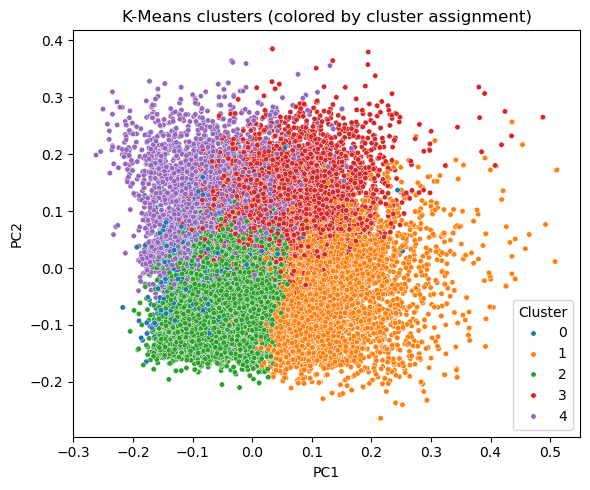

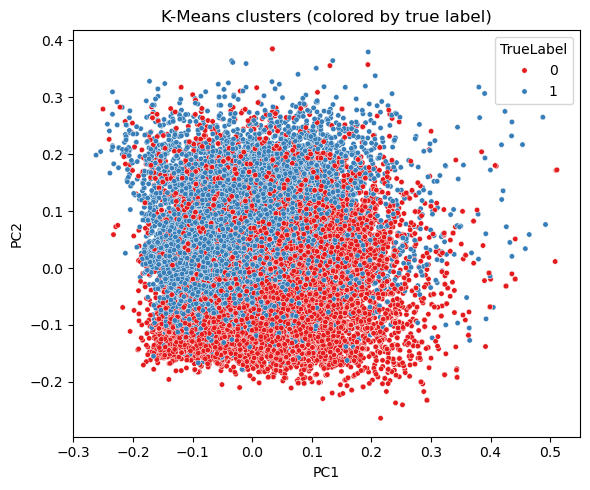

In [34]:
pca = PCA(n_components=2, random_state=SEED)
x_train_pca = pca.fit_transform(x_train_dense)

pca_df = pd.DataFrame({
    'PC1': x_train_pca[:,0],
    'PC2': x_train_pca[:,1],
    'Cluster': cluster_labels,
    'TrueLabel': y_train
})

# Plot clusters colored by cluster assignment
plt.figure(figsize=(6,5))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Cluster', palette='tab10', s=15)
plt.title('K-Means clusters (colored by cluster assignment)')
plt.tight_layout()
plt.savefig('clusters_by_cluster.png')
plt.show()

# Plot clusters colored by true label
plt.figure(figsize=(6,5))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='TrueLabel', palette='Set1', s=15)
plt.title('K-Means clusters (colored by true label)')
plt.tight_layout()
plt.savefig('clusters_by_label.png')
plt.show()
